In [51]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/weatherww2/Summary of Weather.csv
/kaggle/input/weatherww2/Weather Station Locations.csv


# 2.3
## Abdullah Rafique


In [52]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from numpy import arange


from sklearn.preprocessing import LabelBinarizer
from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff

import warnings
warnings.simplefilter('ignore')


from IPython.display import display, Markdown


## Calculate evaluation metrics (MAE, MSE, RMSE and MAPE) using test set


In [53]:
methods = ['Linear Regression', 'Polynomial Regression', 'Lasso Regression', 'Ridge Regression', 'Elastic Net Regression', 'Decision Tree Regression', 'Random Forest Regression']
err_metrics =  ['MAE', 'MSE', 'RMSE', 'MAPE']

I will be working with all the methods listed above to see which oje works best.

In [54]:
def calculate_metrics(df, method, y_test, y_pred):
    mae = metrics.mean_absolute_error(y_test, y_pred)
    mse = metrics.mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
    mape = metrics.mean_absolute_percentage_error(y_test, y_pred)
    df.loc[method] = [mae, mse, rmse, mape]

In [55]:
# create error dataframe
error_df = pd.DataFrame(columns = err_metrics, index = methods)
display(error_df)

,MAE,MSE,RMSE,MAPE
Linear Regression,NaN,NaN,NaN,NaN
Polynomial Regression,NaN,NaN,NaN,NaN
Lasso Regression,NaN,NaN,NaN,NaN
Ridge Regression,NaN,NaN,NaN,NaN
Elastic Net Regression,NaN,NaN,NaN,NaN
Decision Tree Regression,NaN,NaN,NaN,NaN
Random Forest Regression,NaN,NaN,NaN,NaN


In [1]:
def calculate_cross_validation_scores (df, model, method, X, y):
    k = 10
    mae = cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=k).mean()
    mse = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=k).mean()
    rmse = cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=k).mean()
    mape = cross_val_score(model, X, y, scoring='neg_mean_absolute_percentage_error', cv=k).mean()
    df.loc[method] = [mae, mse, rmse, mape]

In [57]:
cv_df = pd.DataFrame(columns = err_metrics, index = methods)
display(cv_df)

,MAE,MSE,RMSE,MAPE
Linear Regression,NaN,NaN,NaN,NaN
Polynomial Regression,NaN,NaN,NaN,NaN
Lasso Regression,NaN,NaN,NaN,NaN
Ridge Regression,NaN,NaN,NaN,NaN
Elastic Net Regression,NaN,NaN,NaN,NaN
Decision Tree Regression,NaN,NaN,NaN,NaN
Random Forest Regression,NaN,NaN,NaN,NaN


In [58]:
df = pd.read_csv('/kaggle/input/weatherww2/Summary of Weather.csv')
df


,STA,Date,Precip,WindGustSpd,MaxTemp,MinTemp,MeanTemp,Snowfall,PoorWeather,YR,...,FB,FTI,ITH,PGT,TSHDSBRSGF,SD3,RHX,RHN,RVG,WTE
0,10001,1942-7-1,1.016,NaN,25.555556,22.222222,23.888889,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10001,1942-7-2,0,NaN,28.888889,21.666667,25.555556,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10001,1942-7-3,2.54,NaN,26.111111,22.222222,24.444444,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10001,1942-7-4,2.54,NaN,26.666667,22.222222,24.444444,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10001,1942-7-5,0,NaN,26.666667,21.666667,24.444444,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119035,82506,1945-12-27,0,NaN,28.333333,18.333333,23.333333,0.0,NaN,45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
119036,82506,1945-12-28,9.906,NaN,29.444444,18.333333,23.888889,0.0,1.0,45,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
119037,82506,1945-12-29,0,NaN,28.333333,18.333333,23.333333,0.0,1.0,45,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
119038,82506,1945-12-30,0,NaN,28.333333,18.333333,23.333333,0.0,NaN,45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [59]:
df2=pd.read_csv('/kaggle/input/weatherww2/Weather Station Locations.csv')
df2

,WBAN,NAME,STATE/COUNTRY ID,LAT,LON,ELEV,Latitude,Longitude
0,33013,AIN EL,AL,3623N,00637E,611,36.383333,6.650000
1,33031,LA SENIA,AL,3537N,00037E,88,35.616667,0.583333
2,33023,MAISON BLANCHE,AL,3643N,00314E,23,36.716667,3.216667
3,33044,TELERGMA,AL,3607N,00621E,754,36.116667,6.416667
4,12001,TINDOUF,AL,2741N,00809W,443,27.683333,-8.083333
...,...,...,...,...,...,...,...,...
156,33109,EL AQUINA,TS,3651N,01015E,4,36.850000,10.016667
157,33121,EL DJEM,TS,3520N,01040E,9999,35.333333,10.066667
158,33003,SISI AHMED,TS,3712N,00950E,4,37.200000,9.083333
159,33307,ADANA,TU,3659N,03518E,20,36.983333,35.016667


In [60]:
df.shape

(119040, 31)

In [61]:
df2.shape

(161, 8)

In [62]:
df.describe()


,STA,WindGustSpd,MaxTemp,MinTemp,MeanTemp,YR,MO,DA,DR,SPD,...,FT,FB,FTI,ITH,PGT,SD3,RHX,RHN,RVG,WTE
count,119040.000000,532.000000,119040.000000,119040.000000,119040.000000,119040.000000,119040.000000,119040.000000,533.000000,532.000000,...,0.0,0.0,0.0,0.0,525.000000,0.0,0.0,0.0,0.0,0.0
mean,29659.435795,37.774534,27.045111,17.789511,22.411631,43.805284,6.726016,15.797530,26.998124,20.396617,...,NaN,NaN,NaN,NaN,12.085333,NaN,NaN,NaN,NaN,NaN
std,20953.209402,10.297808,8.717817,8.334572,8.297982,1.136718,3.425561,8.794541,15.221732,5.560371,...,NaN,NaN,NaN,NaN,5.731328,NaN,NaN,NaN,NaN,NaN
min,10001.000000,18.520000,-33.333333,-38.333333,-35.555556,40.000000,1.000000,1.000000,2.000000,10.000000,...,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
25%,11801.000000,29.632000,25.555556,15.000000,20.555556,43.000000,4.000000,8.000000,11.000000,16.000000,...,NaN,NaN,NaN,NaN,8.500000,NaN,NaN,NaN,NaN,NaN
50%,22508.000000,37.040000,29.444444,21.111111,25.555556,44.000000,7.000000,16.000000,32.000000,20.000000,...,NaN,NaN,NaN,NaN,11.600000,NaN,NaN,NaN,NaN,NaN
75%,33501.000000,43.059000,31.666667,23.333333,27.222222,45.000000,10.000000,23.000000,34.000000,23.250000,...,NaN,NaN,NaN,NaN,15.000000,NaN,NaN,NaN,NaN,NaN
max,82506.000000,75.932000,50.000000,34.444444,40.000000,45.000000,12.000000,31.000000,78.000000,41.000000,...,NaN,NaN,NaN,NaN,23.900000,NaN,NaN,NaN,NaN,NaN


In [63]:
df2.describe()

,WBAN,ELEV,Latitude,Longitude
count,161.000000,161.000000,161.000000,161.000000
mean,33421.440994,439.850932,20.347205,8.364182
std,20826.534394,1745.422339,21.042992,87.420419
min,10001.000000,1.000000,-27.600000,-175.000000
25%,13601.000000,9.000000,8.233333,-60.850000
50%,32906.000000,27.000000,22.333333,9.083333
75%,34150.000000,98.000000,36.116667,67.250000
max,82506.000000,9999.000000,67.016667,177.366667


In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119040 entries, 0 to 119039
Data columns (total 31 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   STA          119040 non-null  int64  
 1   Date         119040 non-null  object 
 2   Precip       119040 non-null  object 
 3   WindGustSpd  532 non-null     float64
 4   MaxTemp      119040 non-null  float64
 5   MinTemp      119040 non-null  float64
 6   MeanTemp     119040 non-null  float64
 7   Snowfall     117877 non-null  object 
 8   PoorWeather  34237 non-null   object 
 9   YR           119040 non-null  int64  
 10  MO           119040 non-null  int64  
 11  DA           119040 non-null  int64  
 12  PRCP         117108 non-null  object 
 13  DR           533 non-null     float64
 14  SPD          532 non-null     float64
 15  MAX          118566 non-null  float64
 16  MIN          118572 non-null  float64
 17  MEA          118542 non-null  float64
 18  SNF          117877 non-

## Step 2: Understanding the variables

In [65]:
cat_df = df.select_dtypes(exclude='number')
cat_df

,Date,Precip,Snowfall,PoorWeather,PRCP,SNF,TSHDSBRSGF
0,1942-7-1,1.016,0.0,NaN,0.04,0.0,NaN
1,1942-7-2,0,0.0,NaN,0,0.0,NaN
2,1942-7-3,2.54,0.0,NaN,0.1,0.0,NaN
3,1942-7-4,2.54,0.0,NaN,0.1,0.0,NaN
4,1942-7-5,0,0.0,NaN,0,0.0,NaN
...,...,...,...,...,...,...,...
119035,1945-12-27,0,0.0,NaN,0,0.0,NaN
119036,1945-12-28,9.906,0.0,1.0,0.39,0.0,1.0
119037,1945-12-29,0,0.0,1.0,0,0.0,1.0
119038,1945-12-30,0,0.0,NaN,0,0.0,NaN


In [66]:
for col in cat_df.columns:
    print(df[col].value_counts())
    fig = px.histogram(cat_df, x=col)
    fig.show()

1945-4-16     122
1945-4-22     122
1945-4-29     122
1945-4-27     122
1945-4-26     122
             ... 
1940-1-30       3
1940-1-31       3
1940-12-25      3
1940-1-16       3
1940-1-15       3
Name: Date, Length: 2192, dtype: int64


0          64267
T          16753
0.254       3389
0.508       2909
0.762       2015
           ...  
123.698        1
106.68         1
126.492        1
123.952        1
161.036        1
Name: Precip, Length: 540, dtype: int64


0.0        86090
0          29600
5.08         527
7.62         319
2.54         317
10.16        195
12.7          90
20.32         83
17.78         78
15.24         70
22.86         69
25.4          68
#VALUE!       44
27.94         40
30.48         31
45.72         25
50.8          24
48.26         22
2.54          22
35.56         20
33.02         15
60.96         13
7.62          11
38.1          11
66.04         11
53.34         10
43.18         10
10.16         10
63.5           7
5.08           7
55.88          6
40.64          6
76.2           5
58.42          5
15.24          4
81.28          4
78.74          2
12.7           2
83.82          1
68.58          1
86.36          1
73.66          1
Name: Snowfall, dtype: int64


1             25846
1.0            6134
0               870
1     1         310
100000          263
1 1             133
1 1  1           96
1000             91
100001           62
1    1           56
101000           56
1000001000       52
1  1             49
1000001001       45
11               39
1100000          16
1001             16
1   1 1          14
101001           14
1000101001       13
1000101000        9
11 1              8
1000000           7
1000000000        6
1     1  1        5
11    1           5
1010001000        5
1010001001        2
1 0  1            2
1   1 1  1        2
1000100001        2
1101000           2
10001001          1
1     0           1
1000100000        1
1 0               1
1101001           1
1   1             1
1        1        1
Name: PoorWeather, dtype: int64


0       62335
T       16753
0.01     3389
0.02     2909
0.03     2015
        ...  
4.87        1
4.2         1
4.98        1
4.88        1
6.34        1
Name: PRCP, Length: 540, dtype: int64


0.0    86090
0      29600
0.2      527
0.3      319
0.1      317
0.4      195
0.5       90
0.8       83
0.7       78
0.6       70
0.9       69
1         68
T         44
1.1       40
1.2       31
1.8       25
2         24
1.9       22
0.1       22
1.4       20
1.3       15
2.4       13
0.3       11
1.5       11
2.6       11
2.1       10
1.7       10
0.4       10
2.5        7
0.2        7
2.2        6
1.6        6
3          5
2.3        5
0.6        4
3.2        4
3.1        2
0.5        2
3.3        1
2.7        1
3.4        1
2.9        1
Name: SNF, dtype: int64


1             25846
1.0            6134
0               870
1     1         310
100000          263
1 1             133
1 1  1           96
1000             91
100001           62
1    1           56
101000           56
1000001000       52
1  1             49
1000001001       45
11               39
1100000          16
1001             16
1   1 1          14
101001           14
1000101001       13
1000101000        9
11 1              8
1000000           7
1000000000        6
1     1  1        5
11    1           5
1010001000        5
1010001001        2
1 0  1            2
1   1 1  1        2
1000100001        2
1101000           2
10001001          1
1     0           1
1000100000        1
1 0               1
1101001           1
1   1             1
1        1        1
Name: TSHDSBRSGF, dtype: int64


<Figure size 2000x2000 with 0 Axes>

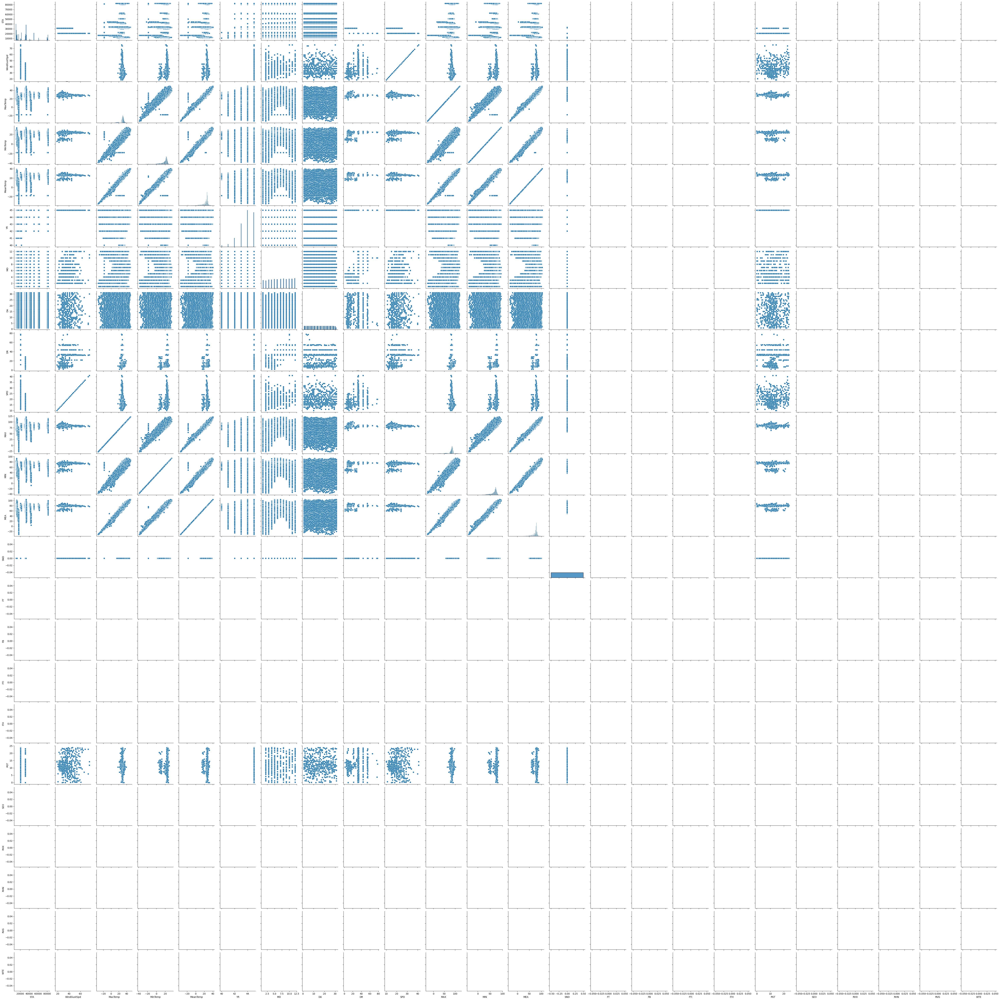

In [67]:
plt.figure(figsize=(20, 20))
sns.pairplot(df)
plt.show()

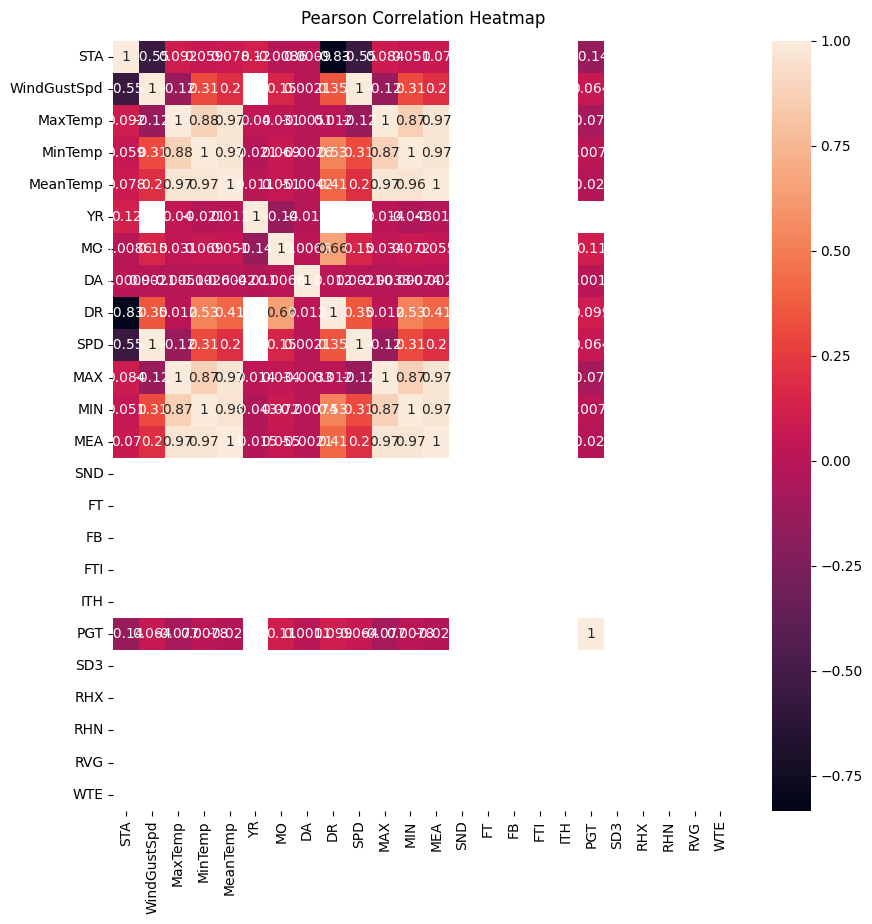

In [68]:
plt.figure(figsize=(10, 10))
heatmap = sns.heatmap(df.corr(method='pearson'), annot=True)
heatmap.set_title('Pearson Correlation Heatmap', fontdict={'fontsize':12}, pad=12);
plt.show()

## Part 1: Handling missing data

In [69]:
missing_ratio = df.isnull().sum() / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'missing_ratio': missing_ratio})
missing_value_df

,column_name,missing_ratio
STA,STA,0.000000
Date,Date,0.000000
Precip,Precip,0.000000
WindGustSpd,WindGustSpd,0.995531
MaxTemp,MaxTemp,0.000000
MinTemp,MinTemp,0.000000
MeanTemp,MeanTemp,0.000000
Snowfall,Snowfall,0.009770
PoorWeather,PoorWeather,0.712391
YR,YR,0.000000


### Visualize missing values using missingno

<AxesSubplot: >

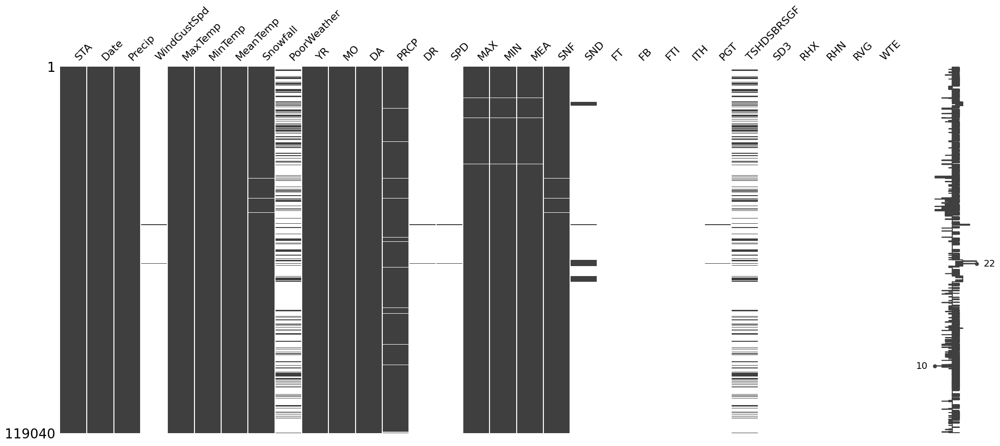

In [70]:
import missingno as msno
msno.matrix(df)

## Part 2: Encoding

In [71]:
df_float = df.select_dtypes(include='float')

In [72]:
le_cols =  []

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for col in le_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(dataset[col])
display(df)

,STA,Date,Precip,WindGustSpd,MaxTemp,MinTemp,MeanTemp,Snowfall,PoorWeather,YR,...,FB,FTI,ITH,PGT,TSHDSBRSGF,SD3,RHX,RHN,RVG,WTE
0,10001,1942-7-1,1.016,NaN,25.555556,22.222222,23.888889,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10001,1942-7-2,0,NaN,28.888889,21.666667,25.555556,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10001,1942-7-3,2.54,NaN,26.111111,22.222222,24.444444,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10001,1942-7-4,2.54,NaN,26.666667,22.222222,24.444444,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10001,1942-7-5,0,NaN,26.666667,21.666667,24.444444,0.0,NaN,42,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119035,82506,1945-12-27,0,NaN,28.333333,18.333333,23.333333,0.0,NaN,45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
119036,82506,1945-12-28,9.906,NaN,29.444444,18.333333,23.888889,0.0,1.0,45,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
119037,82506,1945-12-29,0,NaN,28.333333,18.333333,23.333333,0.0,1.0,45,...,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
119038,82506,1945-12-30,0,NaN,28.333333,18.333333,23.333333,0.0,NaN,45,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119040 entries, 0 to 119039
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   STA       119040 non-null  int64  
 1   Date      119040 non-null  object 
 2   Precip    119040 non-null  object 
 3   MaxTemp   119040 non-null  float64
 4   MinTemp   119040 non-null  float64
 5   MeanTemp  119040 non-null  float64
 6   YR        119040 non-null  int64  
 7   MO        119040 non-null  int64  
 8   DA        119040 non-null  int64  
dtypes: float64(3), int64(4), object(2)
memory usage: 8.2+ MB


In [ ]:
# here is the list of the names of the categorical columns to apply onehot encoding
ohe_cols = ['Snowfall']

from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

ohe = OneHotEncoder()
ct = make_column_transformer((ohe, ohe_cols), remainder = 'passthrough' )
ct.fit_transform(df)

def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    return(res)


# one hot encode columns
for col in ohe_cols:
    df = encode_and_bind(df, col)


# delete the origin columns
for col in ohe_cols:
    del df[col]
    
display(df)

In [118]:
df.dropna(axis=0, subset=['Date'], inplace=True)

target = df.Date

# Since missing values isn't the focus of this tutorial, we use the simplest
# possible approach, which drops these columns. 
# For more detail (and a better approach) to missing values, see
# https://www.kaggle.com/dansbecker/handling-missing-values
cols_with_missing = [col for col in df.columns 
                                 if df[col].isnull().any()]                                  
candidate_train_predictors = df.drop(['STA', 'Date'] + cols_with_missing, axis=1)
candidate_test_predictors = df.drop(['STA'] + cols_with_missing, axis=1)

# "cardinality" means the number of unique values in a column.
# We use it as our only way to select categorical columns here. This is convenient, though
# a little arbitrary.
low_cardinality_cols = [cname for cname in candidate_train_predictors.columns if 
                                candidate_train_predictors[cname].nunique() < 10 and
                                candidate_train_predictors[cname].dtype == "object"]
numeric_cols = [cname for cname in candidate_train_predictors.columns if 
                                candidate_train_predictors[cname].dtype in ['int64', 'float64']]
my_cols = low_cardinality_cols + numeric_cols
train_predictors = candidate_train_predictors[my_cols]
test_predictors = candidate_test_predictors[my_cols]

In [126]:
train_predictors.dtypes.sample(5)

DA            int64
MO            int64
MinTemp     float64
MaxTemp     float64
MeanTemp    float64
dtype: object

In [129]:
one_hot_encoded_training_predictors = pd.get_dummies(train_predictors)

In [145]:
import pandas as pd

# Assuming you have a DataFrame called 'df'
# To delete a single column, you can specify the column name in the 'columns' parameter of the drop() function
df = df.dropna(axis=1)

# Alternatively, you can use the 'del' keyword to delete a column in-place
print(df)

          STA   MaxTemp   MinTemp  MeanTemp  YR  MO  DA
0       10001  0.706667  0.832061  0.786765  42   7   1
1       10001  0.746667  0.824427  0.808824  42   7   2
2       10001  0.713333  0.832061  0.794118  42   7   3
3       10001  0.720000  0.832061  0.794118  42   7   4
4       10001  0.720000  0.824427  0.794118  42   7   5
...       ...       ...       ...       ...  ..  ..  ..
119035  82506  0.740000  0.778626  0.779412  45  12  27
119036  82506  0.753333  0.778626  0.786765  45  12  28
119037  82506  0.740000  0.778626  0.779412  45  12  29
119038  82506  0.740000  0.778626  0.779412  45  12  30
119039  82506  0.753333  0.763359  0.779412  45  12  31

[119040 rows x 7 columns]


In [146]:
scaled_cols = [ 'MaxTemp', 'MeanTemp','MinTemp']

from sklearn.preprocessing import MinMaxScaler
mmsc = MinMaxScaler()

# Store the scaling result in the same columns
df[scaled_cols] = pd.DataFrame(mmsc.fit_transform(df[scaled_cols]))
df

,STA,MaxTemp,MinTemp,MeanTemp,YR,MO,DA
0,10001,0.706667,0.832061,0.786765,42,7,1
1,10001,0.746667,0.824427,0.808824,42,7,2
2,10001,0.713333,0.832061,0.794118,42,7,3
3,10001,0.720000,0.832061,0.794118,42,7,4
4,10001,0.720000,0.824427,0.794118,42,7,5
...,...,...,...,...,...,...,...
119035,82506,0.740000,0.778626,0.779412,45,12,27
119036,82506,0.753333,0.778626,0.786765,45,12,28
119037,82506,0.740000,0.778626,0.779412,45,12,29
119038,82506,0.740000,0.778626,0.779412,45,12,30


### Determine independent variables (X) and dependent variable (y)

In [147]:
# Dependent variable column
y_label = 'MeanTemp'

# Independent variables
X = df.loc[:, df.columns != y_label]
display(pd.DataFrame(X))

# Dependent variable
y = df.loc[:, y_label]
display(pd.DataFrame(y))

,STA,MaxTemp,MinTemp,YR,MO,DA
0,10001,0.706667,0.832061,42,7,1
1,10001,0.746667,0.824427,42,7,2
2,10001,0.713333,0.832061,42,7,3
3,10001,0.720000,0.832061,42,7,4
4,10001,0.720000,0.824427,42,7,5
...,...,...,...,...,...,...
119035,82506,0.740000,0.778626,45,12,27
119036,82506,0.753333,0.778626,45,12,28
119037,82506,0.740000,0.778626,45,12,29
119038,82506,0.740000,0.778626,45,12,30


,MeanTemp
0,0.786765
1,0.808824
2,0.794118
3,0.794118
4,0.794118
...,...
119035,0.779412
119036,0.786765
119037,0.779412
119038,0.779412


In [148]:
# Determine the test size
my_test_size = 0.2


from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=my_test_size, shuffle=False)
X_train.describe()


,STA,MaxTemp,MinTemp,YR,MO,DA
count,95232.000000,95232.000000,95232.000000,95232.000000,95232.000000,95232.000000
mean,20811.906901,0.718691,0.761264,43.752657,6.698442,15.794460
std,9696.850668,0.113275,0.120740,1.184597,3.429790,8.796076
min,10001.000000,0.000000,0.000000,40.000000,1.000000,1.000000
25%,11606.000000,0.693333,0.709924,43.000000,4.000000,8.000000
50%,16407.000000,0.753333,0.801527,44.000000,7.000000,16.000000
75%,32701.000000,0.780000,0.839695,45.000000,10.000000,23.000000
max,34150.000000,1.000000,1.000000,45.000000,12.000000,31.000000


In [149]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 95232 entries, 0 to 95231
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   STA      95232 non-null  int64  
 1   MaxTemp  95232 non-null  float64
 2   MinTemp  95232 non-null  float64
 3   YR       95232 non-null  int64  
 4   MO       95232 non-null  int64  
 5   DA       95232 non-null  int64  
dtypes: float64(2), int64(4)
memory usage: 5.1 MB


In [150]:
y_train.describe()

count    95232.000000
mean         0.759221
std          0.117750
min          0.000000
25%          0.720588
50%          0.801471
75%          0.830882
max          1.000000
Name: MeanTemp, dtype: float64

In [151]:
y_train.info()

<class 'pandas.core.series.Series'>
Int64Index: 95232 entries, 0 to 95231
Series name: MeanTemp
Non-Null Count  Dtype  
--------------  -----  
95232 non-null  float64
dtypes: float64(1)
memory usage: 1.5 MB


In [152]:
for method in methods:

    # Display method name in markdown    
    display(Markdown("## " + method))

    # Depending on the method, different class has to be called to create the model
    
    # We handle the polynomial regression differently compared to other models
    if method == 'Polynomial Regression':

        # Fitting Polynomial Regression to the dataset. We need to transform the training and test sets to have polynomial features
        from sklearn.preprocessing import PolynomialFeatures
        poly_reg = PolynomialFeatures(degree = 2)
        X_poly_train = poly_reg.fit_transform(X_train)
        X_poly_test = poly_reg.fit_transform(X_test)
        poly_reg.fit(X_poly_train, y_train)


        # the code to compare the results of polynomial regression to linear regression
        lin_reg_2 = LinearRegression()
        lin_reg_2.fit(X_poly_train, y_train)

        # Predict test set result
        y_pred = lin_reg_2.predict(X_poly_test)
        display(pd.DataFrame(y_pred))



    else:

        if method == 'Linear Regression':
            from sklearn.linear_model import LinearRegression
            regressor = LinearRegression()
    
        elif method == 'Lasso Regression':
            from sklearn.linear_model import Lasso
            from sklearn.linear_model import LassoCV

            # Define model for hyperparameter tuning
            model = LassoCV(cv=10)
            model.fit(X,y)
            print('alpha: ' + str(model.alpha_))
            print('score: ' + str(model.score(X,y)))

            # Define Lasso regression model
            regressor = Lasso(alpha = model.alpha_)
        
        elif method == 'Ridge Regression':
            from sklearn.linear_model import Ridge
            from sklearn.linear_model import RidgeCV

            # Define model for hyperparameter tuning
            model = RidgeCV(cv=10)
            model.fit(X,y)

            print('alpha : ' + str(model.alpha_))
            print('score : ' + str(model.score(X,y)))

            # Define Ridge regression model
            regressor = Ridge(alpha = model.alpha_)
        
        elif method == 'Elastic Net Regression':

            from sklearn.linear_model import ElasticNet
            from sklearn.linear_model import ElasticNetCV


            # define model parameter
            my_alpha = 1.0
            my_l1_ratio = 0.5

            regressor = ElasticNet(alpha = my_alpha, l1_ratio = my_l1_ratio)
        
        elif method == 'Decision Tree Regression':
            from sklearn.tree import DecisionTreeRegressor
            regressor = DecisionTreeRegressor(min_samples_split  = 5)
    
        elif method == 'Random Forest Regression':
            from sklearn.ensemble import RandomForestRegressor
            regressor = RandomForestRegressor(n_estimators = 100, random_state = 0)
        
        else:
            display(Markdown("## No code for " + method + " found"))
        
    

    
        # Fit the data to the model
        regressor.fit(X_train, y_train)
    
        # Prediction using test set 
        y_pred = regressor.predict(X_test)
        display(pd.DataFrame(y_pred))
    
    
    
    # Calculate evaluation metrics using test dataset
    display(Markdown("### Evaluation metrics using test dataset"))
    calculate_metrics(error_df, method, y_test, y_pred)
    display(error_df)
    
    # Calculate evaluation metrics using k fold cross validation
    display(Markdown("### Evaluation metrics using k fold cross validation"))
    calculate_cross_validation_scores (cv_df, regressor, method, X, y)
    display(cv_df)

## Linear Regression

,0
0,0.857092
1,0.838628
2,0.838536
3,0.846077
4,0.827524
...,...
23803,0.778376
23804,0.785828
23805,0.778370
23806,0.778366


### Evaluation metrics using test dataset

,MAE,MSE,RMSE,MAPE
Linear Regression,0.002391,0.000057,0.007583,0.003322
Polynomial Regression,0.005938,0.000097,0.009839,0.007723
Lasso Regression,0.061098,0.005168,0.071889,0.079939
Ridge Regression,0.002389,0.000057,0.007581,0.003317
Elastic Net Regression,0.100417,0.011989,0.109493,0.126687
Decision Tree Regression,0.001667,0.000079,0.008888,0.002358
Random Forest Regression,0.001623,0.000068,0.008227,0.002285


### Evaluation metrics using k fold cross validation

,MAE,MSE,RMSE,MAPE
Linear Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Polynomial Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Lasso Regression,-0.081439,-0.012929,-0.106542,-29194982560.73278
Ridge Regression,-0.002211,-0.000047,-0.006287,-212993528.307355
Elastic Net Regression,-0.082479,-0.013095,-0.107295,-29054832885.896614
Decision Tree Regression,-0.001087,-0.000078,-0.007132,-6676351442.954592
Random Forest Regression,NaN,NaN,NaN,NaN


## Polynomial Regression

,0
0,0.856599
1,0.838516
2,0.839355
3,0.844821
4,0.827804
...,...
23803,0.775739
23804,0.784570
23805,0.775820
23806,0.775862


### Evaluation metrics using test dataset

,MAE,MSE,RMSE,MAPE
Linear Regression,0.002391,0.000057,0.007583,0.003322
Polynomial Regression,0.005938,0.000097,0.009839,0.007723
Lasso Regression,0.061098,0.005168,0.071889,0.079939
Ridge Regression,0.002389,0.000057,0.007581,0.003317
Elastic Net Regression,0.100417,0.011989,0.109493,0.126687
Decision Tree Regression,0.001667,0.000079,0.008888,0.002358
Random Forest Regression,0.001623,0.000068,0.008227,0.002285


### Evaluation metrics using k fold cross validation

,MAE,MSE,RMSE,MAPE
Linear Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Polynomial Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Lasso Regression,-0.081439,-0.012929,-0.106542,-29194982560.73278
Ridge Regression,-0.002211,-0.000047,-0.006287,-212993528.307355
Elastic Net Regression,-0.082479,-0.013095,-0.107295,-29054832885.896614
Decision Tree Regression,-0.001087,-0.000078,-0.007132,-6676351442.954592
Random Forest Regression,NaN,NaN,NaN,NaN


## Lasso Regression

alpha: 179.75113938305762
score: 0.0


,0
0,0.759221
1,0.759221
2,0.759221
3,0.759221
4,0.759221
...,...
23803,0.759221
23804,0.759221
23805,0.759221
23806,0.759221


### Evaluation metrics using test dataset

,MAE,MSE,RMSE,MAPE
Linear Regression,0.002391,0.000057,0.007583,0.003322
Polynomial Regression,0.005938,0.000097,0.009839,0.007723
Lasso Regression,0.061098,0.005168,0.071889,0.079939
Ridge Regression,0.002389,0.000057,0.007581,0.003317
Elastic Net Regression,0.100417,0.011989,0.109493,0.126687
Decision Tree Regression,0.001667,0.000079,0.008888,0.002358
Random Forest Regression,0.001623,0.000068,0.008227,0.002285


### Evaluation metrics using k fold cross validation

,MAE,MSE,RMSE,MAPE
Linear Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Polynomial Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Lasso Regression,-0.081439,-0.012929,-0.106542,-29194982560.73278
Ridge Regression,-0.002211,-0.000047,-0.006287,-212993528.307355
Elastic Net Regression,-0.082479,-0.013095,-0.107295,-29054832885.896614
Decision Tree Regression,-0.001087,-0.000078,-0.007132,-6676351442.954592
Random Forest Regression,NaN,NaN,NaN,NaN


## Ridge Regression

alpha : 1.0
score : 0.9961726008192614


,0
0,0.857020
1,0.838567
2,0.838480
3,0.846007
4,0.827470
...,...
23803,0.778388
23804,0.785831
23805,0.778381
23806,0.778378


### Evaluation metrics using test dataset

,MAE,MSE,RMSE,MAPE
Linear Regression,0.002391,0.000057,0.007583,0.003322
Polynomial Regression,0.005938,0.000097,0.009839,0.007723
Lasso Regression,0.061098,0.005168,0.071889,0.079939
Ridge Regression,0.002389,0.000057,0.007581,0.003317
Elastic Net Regression,0.100417,0.011989,0.109493,0.126687
Decision Tree Regression,0.001667,0.000079,0.008888,0.002358
Random Forest Regression,0.001623,0.000068,0.008227,0.002285


### Evaluation metrics using k fold cross validation

,MAE,MSE,RMSE,MAPE
Linear Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Polynomial Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Lasso Regression,-0.081439,-0.012929,-0.106542,-29194982560.73278
Ridge Regression,-0.002211,-0.000047,-0.006287,-212993528.307355
Elastic Net Regression,-0.082479,-0.013095,-0.107295,-29054832885.896614
Decision Tree Regression,-0.001087,-0.000078,-0.007132,-6676351442.954592
Random Forest Regression,NaN,NaN,NaN,NaN


## Elastic Net Regression

,0
0,0.743857
1,0.743857
2,0.743857
3,0.743857
4,0.743857
...,...
23803,0.688155
23804,0.688155
23805,0.688155
23806,0.688155


### Evaluation metrics using test dataset

,MAE,MSE,RMSE,MAPE
Linear Regression,0.002391,0.000057,0.007583,0.003322
Polynomial Regression,0.005938,0.000097,0.009839,0.007723
Lasso Regression,0.061098,0.005168,0.071889,0.079939
Ridge Regression,0.002389,0.000057,0.007581,0.003317
Elastic Net Regression,0.100417,0.011989,0.109493,0.126687
Decision Tree Regression,0.001667,0.000079,0.008888,0.002358
Random Forest Regression,0.001623,0.000068,0.008227,0.002285


### Evaluation metrics using k fold cross validation

,MAE,MSE,RMSE,MAPE
Linear Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Polynomial Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Lasso Regression,-0.081439,-0.012929,-0.106542,-29194982560.73278
Ridge Regression,-0.002211,-0.000047,-0.006287,-212993528.307355
Elastic Net Regression,-0.082479,-0.013095,-0.107295,-29054832885.896614
Decision Tree Regression,-0.001087,-0.000078,-0.007132,-6676351442.954592
Random Forest Regression,NaN,NaN,NaN,NaN


## Decision Tree Regression

,0
0,0.852941
1,0.838235
2,0.838235
3,0.845588
4,0.823529
...,...
23803,0.779412
23804,0.786765
23805,0.779412
23806,0.779412


### Evaluation metrics using test dataset

,MAE,MSE,RMSE,MAPE
Linear Regression,0.002391,0.000057,0.007583,0.003322
Polynomial Regression,0.005938,0.000097,0.009839,0.007723
Lasso Regression,0.061098,0.005168,0.071889,0.079939
Ridge Regression,0.002389,0.000057,0.007581,0.003317
Elastic Net Regression,0.100417,0.011989,0.109493,0.126687
Decision Tree Regression,0.001637,0.000078,0.008838,0.002322
Random Forest Regression,0.001623,0.000068,0.008227,0.002285


### Evaluation metrics using k fold cross validation

,MAE,MSE,RMSE,MAPE
Linear Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Polynomial Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Lasso Regression,-0.081439,-0.012929,-0.106542,-29194982560.73278
Ridge Regression,-0.002211,-0.000047,-0.006287,-212993528.307355
Elastic Net Regression,-0.082479,-0.013095,-0.107295,-29054832885.896614
Decision Tree Regression,-0.00111,-0.000054,-0.007475,-6676351442.954493
Random Forest Regression,NaN,NaN,NaN,NaN


## Random Forest Regression

,0
0,0.852941
1,0.838235
2,0.838235
3,0.845588
4,0.823603
...,...
23803,0.779485
23804,0.786765
23805,0.779485
23806,0.779485


### Evaluation metrics using test dataset

,MAE,MSE,RMSE,MAPE
Linear Regression,0.002391,0.000057,0.007583,0.003322
Polynomial Regression,0.005938,0.000097,0.009839,0.007723
Lasso Regression,0.061098,0.005168,0.071889,0.079939
Ridge Regression,0.002389,0.000057,0.007581,0.003317
Elastic Net Regression,0.100417,0.011989,0.109493,0.126687
Decision Tree Regression,0.001637,0.000078,0.008838,0.002322
Random Forest Regression,0.001623,0.000068,0.008227,0.002285


### Evaluation metrics using k fold cross validation

,MAE,MSE,RMSE,MAPE
Linear Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Polynomial Regression,-0.002224,-0.000047,-0.006289,-227360767.191506
Lasso Regression,-0.081439,-0.012929,-0.106542,-29194982560.73278
Ridge Regression,-0.002211,-0.000047,-0.006287,-212993528.307355
Elastic Net Regression,-0.082479,-0.013095,-0.107295,-29054832885.896614
Decision Tree Regression,-0.00111,-0.000054,-0.007475,-6676351442.954493
Random Forest Regression,-0.00107,-0.000039,-0.005828,-6879423798.814337


 The best model for the dataset looks to be linear regression, according on the evaluation metrics. In comparison to other models, it regularly produces the lowest error metric values, demonstrating superior accuracy and 
 precision in forecasting the target variable. Low values for MAE, MSE, and RMSE imply that Linear Regression's predictions are more in line with the data's actual values. Based on its impressive performance in this test, this model is suggested for additional study and implementation in real-world applications.